![](https://www.nasa.gov/sites/default/files/thumbnails/image/nasa-logo-web-rgb.png)

# Planetary Mystery

Welcome to your first day as a data intern for NASA! As a fun exercise, all interns will be working to solve... a planetary mystery! 

The dataset you will be working on contains weather data for a planet in our solar system, but the identity of that planet is unknown. Your task is to use your data analytics chops to identify the mystery planet!

As usual, you will begin by exploring your dataset. 

The dataset, provided by NASA, is called `planet_weather.csv`, and it contains the following information: 

- **terrestrial_date**: Date on planet Earth, captured as `yyyy-mm-dd`.

- **sol**: number of elapsed planetary days since beginning measurement.

- **ls**: solar longitude. 0: fall equinox. 90: winter solstice. 180: spring equinox. 270: summer solstice.

- **month**: the month number on the mystery planet.

- **min_temp**: the minimum temperature, in Celsius, during a single day.

- **pressure**: atmospheric pressure, in Pascals.

- **wind_speed**: average wind speed, in meters per second.

- **atmo_opacity**: atmospheric opacity.



# Task 1: Data Inspection

![](https://media.giphy.com/media/pz7LNMYN2dj0hgKaHj/giphy.gif)

In [ ]:
# import pandas and plotly express libraries
import pandas as pd

import plotly.express as px

In [92]:
# load planet_weather.csv data from datasets folder
planet = pd.read_csv('datasets/UPDATED_planet_weather.csv')

In [39]:
# preview the data
print(planet.head())

     id terrestrial_date   sol   ls    month  min_temp  max_temp  pressure  \
0  1895       2018-02-27  1977  135  Month 5     -77.0     -10.0     727.0   
1  1893       2018-02-26  1976  135  Month 5     -77.0     -10.0     728.0   
2  1894       2018-02-25  1975  134  Month 5     -76.0     -16.0     729.0   
3  1892       2018-02-24  1974  134  Month 5     -77.0     -13.0     729.0   
4  1889       2018-02-23  1973  133  Month 5     -78.0     -18.0     730.0   

   wind_speed atmo_opacity  
0         NaN        Sunny  
1         NaN        Sunny  
2         NaN        Sunny  
3         NaN        Sunny  
4         NaN        Sunny  


In [40]:
# How many rows and columns are there in the dataset?
print(f'Rows: {planet.shape[0]}')
print(f'Columns: {planet.shape[1]}')

Rows: 1894
Columns: 10


In [42]:
# what are the names of all the columns?
print(planet.columns)

Index(['id', 'terrestrial_date', 'sol', 'ls', 'month', 'min_temp', 'max_temp',
       'pressure', 'wind_speed', 'atmo_opacity'],
      dtype='object')


In [43]:
# What is the data type of each column?
print(planet.dtypes)

id                    int64
terrestrial_date     object
sol                   int64
ls                    int64
month                object
min_temp            float64
max_temp            float64
pressure            float64
wind_speed          float64
atmo_opacity         object
dtype: object


In [44]:
# How many null values are there in each column?
print(planet.isnull().sum())

id                     0
terrestrial_date       0
sol                    0
ls                     0
month                  0
min_temp              27
max_temp              27
pressure              27
wind_speed          1894
atmo_opacity           0
dtype: int64


In [45]:
# Provide a statistical summary of the DataFrame
print(planet.describe())

                id          sol           ls     min_temp     max_temp  \
count  1894.000000  1894.000000  1894.000000  1867.000000  1867.000000   
mean    948.372228  1007.930306   169.180570   -76.121050   -12.510445   
std     547.088173   567.879561   105.738532     5.504098    10.699454   
min       1.000000     1.000000     0.000000   -90.000000   -35.000000   
25%     475.250000   532.250000    78.000000   -80.000000   -23.000000   
50%     948.500000  1016.500000   160.000000   -76.000000   -11.000000   
75%    1421.750000  1501.750000   259.000000   -72.000000    -3.000000   
max    1895.000000  1977.000000   359.000000   -62.000000    11.000000   

          pressure  wind_speed  
count  1867.000000         0.0  
mean    841.066417         NaN  
std      54.253226         NaN  
min     727.000000         NaN  
25%     800.000000         NaN  
50%     853.000000         NaN  
75%     883.000000         NaN  
max     925.000000         NaN  


# Task 2: Data Cleaning

![](https://media.giphy.com/media/l49JEBkw8tD64fbeE/giphy-downsized-large.gif)

In [61]:
# Looks like the wind speed sensor on the Rover was broken
# Delete wind_speed column, which is filled with null values
planet.drop(columns = ['wind_speed'], inplace = True)
print(planet.columns)

Index(['id', 'terrestrial_date', 'sol', 'ls', 'month', 'min_temp', 'max_temp',
       'pressure', 'atmo_opacity'],
      dtype='object')


In [55]:
# How many unique values are there in the atmo_opacity column?
# hint: both .unique() and .value_counts() will work here
unique_value = planet['atmo_opacity'].nunique()
print(f'The number of unique values in the atmo_opacity column is: {unique_value}')

The number of unique values in the atmo_opacity column is: 2


In [62]:
# The atmosphere sensors were faulty and did not capture accurate data
# Delete atmo_opacity column, which mostly contains identical values
planet.drop(columns = ['atmo_opacity'], inplace = True)
print(planet.columns)

Index(['id', 'terrestrial_date', 'sol', 'ls', 'month', 'min_temp', 'max_temp',
       'pressure'],
      dtype='object')


# Task 3: Data Analysis & Visualization

![](https://media.giphy.com/media/1n8aGJBEXuW0M7ELrB/giphy.gif)



In [63]:
# How many months are there on this planet?
number_months = planet['month'].nunique()
print(f'The number of months that are on this planet is: {number_months}')

The number of months that are on this planet is: 12


In [69]:
# What is the average min_temp for each month?
avg_min_temp = planet.groupby('month')['min_temp'].mean().reset_index()
print(f'The average minimum tempature for each month is: {avg_min_temp}')

The average minimum tempature for each month is:        month   min_temp
0    Month 1 -77.160920
1   Month 10 -71.982143
2   Month 11 -71.985507
3   Month 12 -74.451807
4    Month 2 -79.932584
5    Month 3 -83.307292
6    Month 4 -82.747423
7    Month 5 -79.308725
8    Month 6 -75.299320
9    Month 7 -72.281690
10   Month 8 -68.382979
11   Month 9 -69.171642


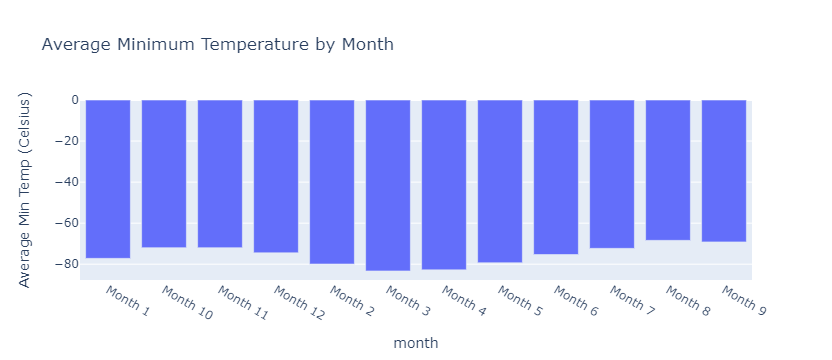

In [72]:
# Plot a bar chart of the average min_temp by month
bar_chart = px.bar(avg_min_temp, x='month', y='min_temp', labels={'min_temp': 'Average Min Temp (Celsius)'}, title='Average Minimum Temperature by Month')
bar_chart.show()

Based on the minimum temperature, what is the coldest month? The warmest month?

Based off the average minimum tempature, the coldest month is month 3 at negative 83.31 degrees celcius, while the warmest month is month 8 at negative 68.38 degrees celcius. 

In [73]:
# What is the average pressure for each month?
avg_pressure = planet.groupby('month')['pressure'].mean().reset_index()
print("\nAverage pressure for each month:")
print(avg_pressure)


Average pressure for each month:
       month    pressure
0    Month 1  862.488506
1   Month 10  887.312500
2   Month 11  857.014493
3   Month 12  842.156627
4    Month 2  889.455056
5    Month 3  877.322917
6    Month 4  806.329897
7    Month 5  748.557047
8    Month 6  745.054422
9    Month 7  795.105634
10   Month 8  873.829787
11   Month 9  913.305970


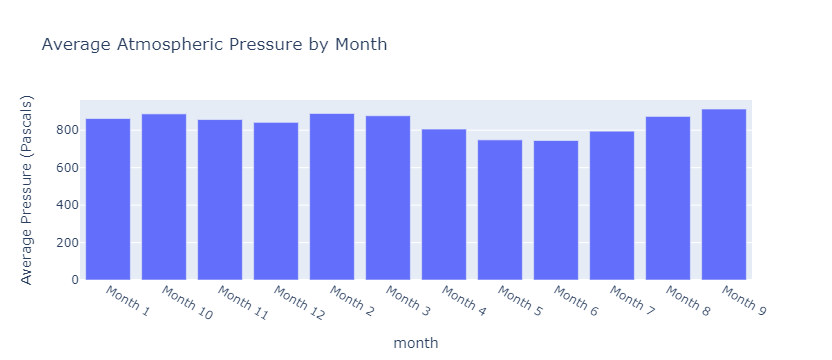

In [75]:
# Create a bar chart of the average atmospheric pressure by month
bar_chart_2 = px.bar(avg_pressure, x='month', y='pressure', labels={'pressure': 'Average Pressure (Pascals)'}, title='Average Atmospheric Pressure by Month')
bar_chart_2.show()

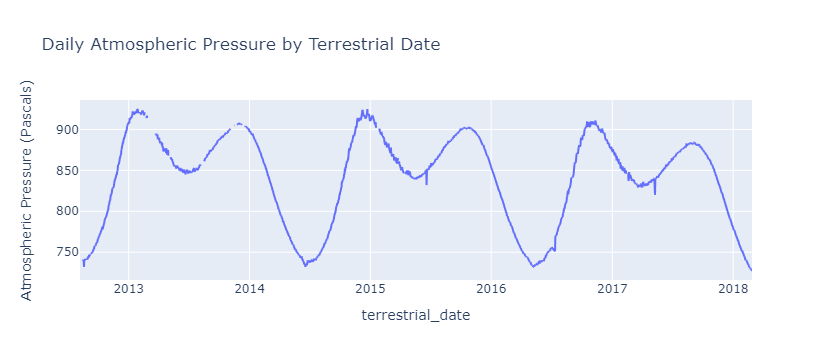

In [76]:
# Plot a line chart of the daily atmospheric pressure by terrestrial date
# note: you do not need to modify the dataframe 
# use the original one you loaded at the beginning of the milestone.
linechart = px.line(planet, x='terrestrial_date', y='pressure', labels={'pressure': 'Atmospheric Pressure (Pascals)'}, title='Daily Atmospheric Pressure by Terrestrial Date')
linechart.show()

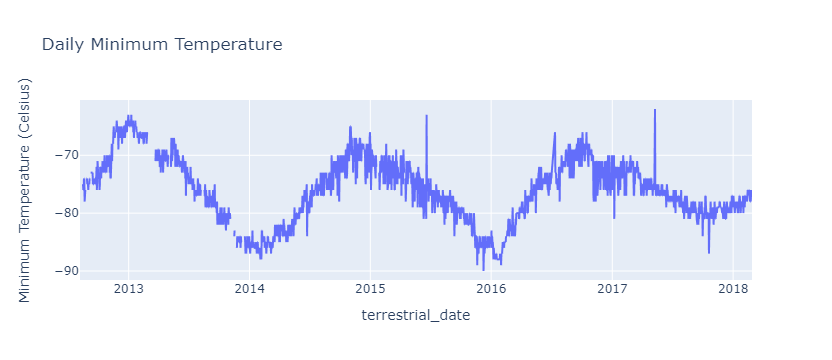

In [78]:
# Plot a line chart the daily minimum temp
# note: you do not need to modify the dataframe 
# use the original one you loaded at the beginning of the milestone.
linechart2 = px.line(planet, x='terrestrial_date', y='min_temp', labels={'min_temp': 'Minimum Temperature (Celsius)'}, title='Daily Minimum Temperature')
linechart2.show()

### Based on this information, approximately how many earth days are there in a year on this planet? 

<span style='background :#FFF59E'>**Note**: To get an approximate range for how long a "year" is on this planet, look at the plots of the atmospheric pressure and the temperatures by day. Use the visualizations to get a *rough estimate* between matching "peaks".</span>

There are approximately 650 earth days in a year on this planet. 

### What is the identity of the planet?

Go to [this wesbsite](https://spaceplace.nasa.gov/years-on-other-planets/en/) and see what planet this lines up with!

After looking at the website provided, I can conclude that the identiy of this planet is Mars!!! 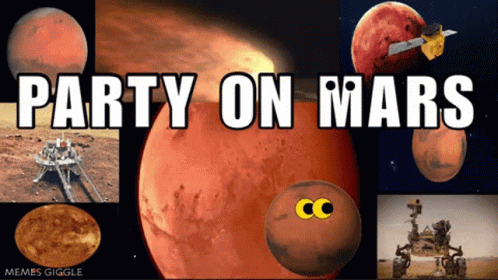

## Congratulations on making your first extra-terrestrial discovery! 

![](https://media.giphy.com/media/5ndfKr0Nv92LkWrKpU/giphy.gif)

# Level Up

![](https://media.giphy.com/media/kjjRGpezebjaw/giphy.gif)

Earlier in the milestone you investigated how many months were in our Mystery Planet. Unfortunately, the answer (12) was not very satisfying. This is because there is no standard calendar for Mars. When the data was collected, they used 12 "months" though each month is longer than a typical Earth month. Let's investigate!

First, filter your dataset so that you are only looking at any `terrestrial_date` before 2014. 

<span style='background :#FFF59E'>**Note**: Since the `terrestrial_date` is a `string` data type, this is simply checking for all values that satisfy the condition `< '2014'` (<-- don't forget the quotes!) </span>

In [98]:
# filter to all values where terrestrial_date is before 2014
filtered_data = planet[planet['terrestrial_date'] < '2014-01-01']

# store it in a new variable.
planet['terrestrial_date'] = pd.to_datetime(planet['terrestrial_date'])



<span style='background :#DDD5F3'>If done correctly, you will have a dataframe with `441` rows.</span>

Lastly, for each month in the dataframe, return both the `min` value and the `max` value of the `terrestrial_date` field.

<span style='background :#FFF59E'>**Hint 1**: Use `.groupby()`</span> 

<span style='background :#FFF59E'>**Hint 2**: In the dictionary for your `.agg()` function, pass a `list` of values. e.g. `{col_to_check: [func1, func2]}`. Remember to use the appropriate values / variables from the dataframe and the desired functions.</span>

In [99]:
# For each month, calculate the min & max value of the terrestrial_date field.
min_max = filtered_data.groupby('month')['terrestrial_date'].agg([min, max]).reset_index()

min_max['days_in_month'] = (min_max['max'] - min_max['min']).dt.days

print(min_max)


      month        min        max  days_in_month
0   Month 1 2013-08-01 2013-10-02             62
1  Month 10 2013-02-24 2013-04-12             47
2  Month 11 2013-04-13 2013-06-04             52
3  Month 12 2013-06-05 2013-07-31             56
4   Month 2 2013-10-03 2013-12-08             66
5   Month 3 2013-12-09 2013-12-31             22
6   Month 6 2012-08-07 2012-09-29             53
7   Month 7 2012-09-30 2012-11-19             50
8   Month 8 2012-11-20 2013-01-07             48
9   Month 9 2013-01-08 2013-02-23             46


How many Earth days, roughly, are there in each "month" in the mystery planet? Does that lineup with what you expected now that you know the identity of the mystery planet?

There is roughly an average of 41 days per month on mars. This is within my margin of expectations.
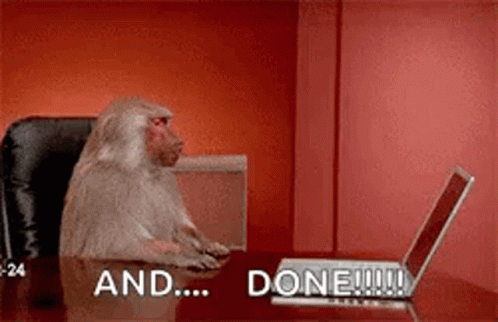